<a href="https://colab.research.google.com/github/Adarsh2345/demo.repo/blob/main/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np


In [ ]:
!unzip "drive/MyDrive/dog-breed-identification (1).zip" -d "drive/MyDrive/Dog Vision"n


Archive:  drive/MyDrive/dog-breed-identification (1).zip
replace drive/MyDrive/Dog Visionn/labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# End-to end multi-class dog breed classification

This notebook builds an end-to end multi-class image classifier using Tensorflow 2.0 and Tensorflow hub

## Problem

Identifying the breed of a dog given the image of a dog.

When Im sitting at a cafe and I take a photo of a dog,I want to know what the breed of the dog it is.

##Data

The data we are using is from Kaggle dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

##3.Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

##4.Features

Some information about the data
*  Were dealing with unstructured data(images) so its probably best if you use deep learning/transfer learning
*  There are 120 breeds of dog(this means there are 120 different classes)
* There are around 10000 images in the training set.(these images have labels)
* There are around 10000 images in the test set.(these images dont have labels)




### Get our workspace ready


In [ ]:
# Import tensorflow into colab
import tensorflow as tf
print("TF version:",tf.__version__)

TF version: 2.17.0


In [ ]:
# Import TF 2.x

try:
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


### Get our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow hub
* Make sure we are using a GPU



In [ ]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("Hub version:",hub.__version__)

#Check GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.17.0
Hub version: 0.16.1
GPU available


##Getting our data ready(turning into tensors)

With all machine learning problems,our data has to be in numerical format.So that's what we'll be doing first.(numerical representations).

Let's start by acceesing our data and checking out the labels

In [ ]:
#Checkout the labels of the data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

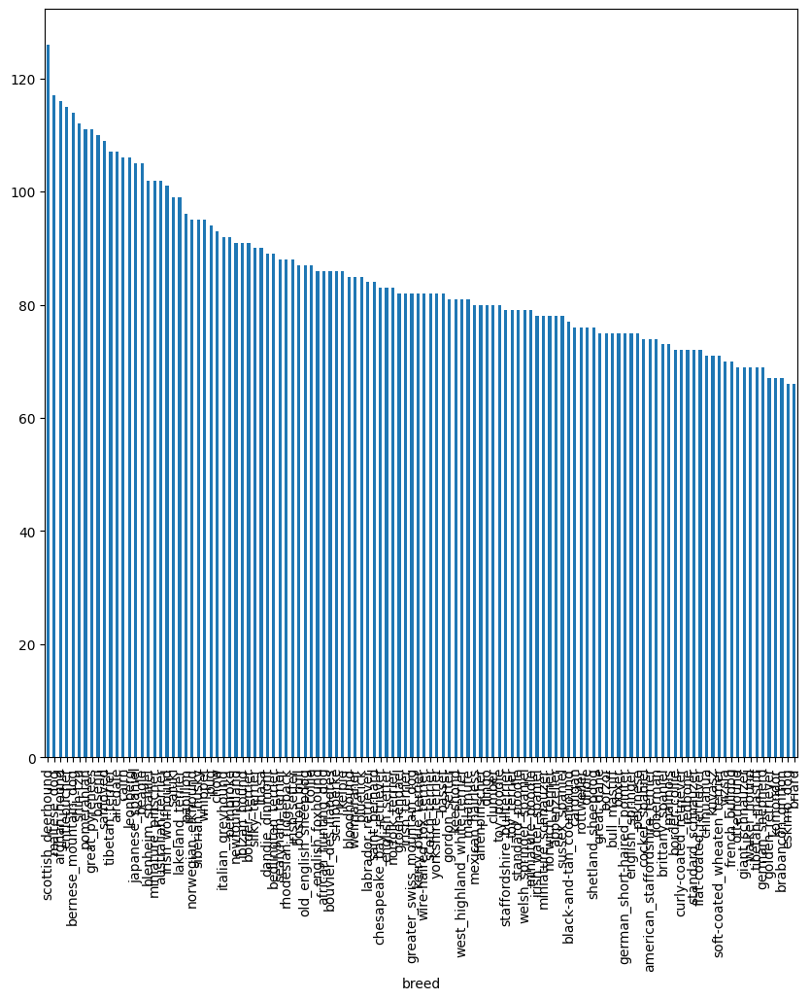

In [ ]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(10,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

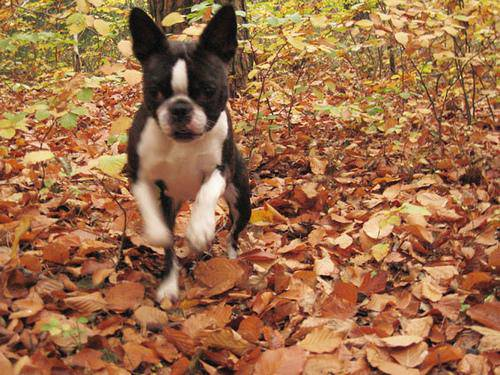

In [ ]:
#Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")


#Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
#Create pathnames from image ID's

filenames=["/content/drive/MyDrive/Dog Vision/train/"+fname for fname in labels_csv["id"]+".jpg"]
filenames[:10]


['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
f=(os.listdir("/content/drive/MyDrive/Dog Vision/train/"))
len(f)

10300

In [ ]:
#Check whether the number of filenames matches the number of actual image files

import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/"))==len(filenames):
  print('Filenames match actual image count')
else:
  print("Filenames do not match actual image count")

Filenames do not match actual image count


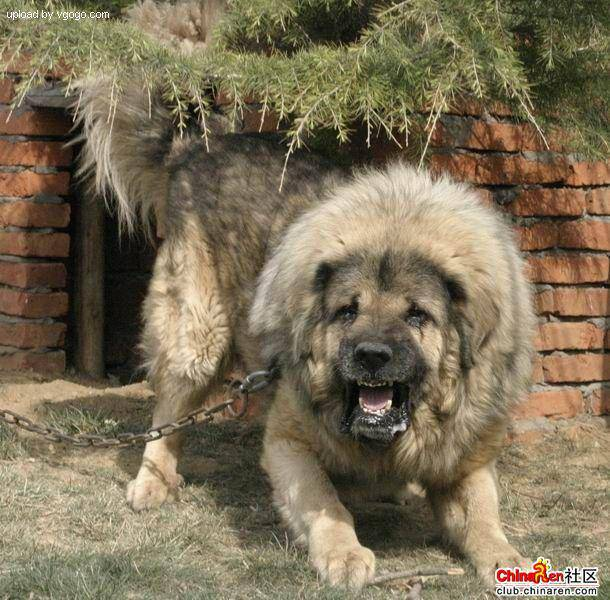

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got our training image fiepaths in a list, let's create a table

In [ ]:
breeds=labels_csv['breed']
breeds

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [ ]:
#Find the unique label values
unique_breeds=np.unique(breeds)
unique_breeds
len(unique_breeds)


120

In [ ]:
#Turn a single label into an array of booleans
print(breeds[0])
breeds[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels=[breed==unique_breeds for breed in breeds]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Example:Turning boolean array into integers
print(breeds[0])
print(np.where(unique_breeds==breeds[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in the boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(breeds[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


###Creating our own validation set

Since the dataset from kaggle does not contain a validation set, we are going to create our own.

In [ ]:
#Setup X and y variables
X=filenames
y=boolean_labels


##We're going to start off experimenting 1000 images and increase them as we need

In [ ]:
#Set number of images to be used for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
#Let's split our data into training and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

#Split them into training and validation sets of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
#Let's have a peek at the training data
X_train[:5],y_train[:2]


(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

##Preprocess images(turning images into tensors)

To preprocess our images into tensors we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable,`image`
3. Turn our `image`(a jpg) into tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`


In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
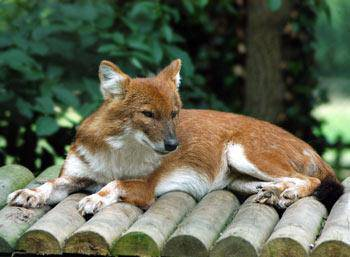

In [ ]:
image

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now that we know how a tensor look like, let us make a function to preprocess them
1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable,`image`
3. Turn our `image`(a jpg) into tensors
4. Normalize our image(convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
#Define image size
IMG_SIZE=224

#Create a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):

  """
  Takes an image file path and turns the image into a Tensor.

  """
#Read in an image file
  image=tf.io.read_file(image_path)

#Turn the jpeg image into numerical tensor with 3 colour channels(Read,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)

#Convert the colour channel values from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)

#Resize the image to our desired type
  image=tf.image.resize(image,size=[img_size,img_size])

  return image

##Turning our data into batches

Why turn our data into batches?

Let's say your trying to process 10000+ images in one go...they all might not fit into memory

So that's why we do 32 at a time(you can manually adjust the batch size if needed)

In order to use Tensorflow effectively,we need our data in the form of Tensor tuples which look like this:
(`image`,`label`)



In [ ]:
#Create a function to return a tuple(image,label)
def get_image_label(image_path,label):

  """
  Takes the image file path and the associated label, processes the image and returns a tuple of(image,label)
  """

  image=process_image(image_path)
  return image,label



In [ ]:
#Demo of the above
preprocessed_image=process_image(filenames[42])
label=tf.constant(y[42])
(preprocessed_image,label)

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of tensors of the form:(`image`,`label`),let's make a function to turn all of our data(`X`,`y`)into batches

In [ ]:
#Define the batch size,32 is a good start
BATCH_SIZE=32

#Create a function to turn data into batches
def create_data_batches(X,y=None,test_data=False,valid_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input
  """
  #If the data is a test set, we probably don't have labels
  if test_data:
    print("Creating  test data batches...")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(X))#only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid set, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)#filepaths
    ,tf.constant(y)))#labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))
    #Create(image,label)tuples(this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    #Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


##Visualizing data batches
Our data is now in batches,however,these can be a little hard to understand/comprehend,let's visuaize them

In [ ]:
import matplotlib.pyplot as plt
#Creating function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch,and their corresponding labels
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25(displaying 25 images)
  for i in range(25):

    #Create subplots(5 rows and 5 columns)
    ax=plt.subplot(5,5,i+1)

    #Display an image
    plt.imshow(images[i])

    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    #Turn the grid lines off
    plt.axis("off")




In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.64647645, 0.68177056, 0.7170647 ],
          [0.6398109 , 0.67510504, 0.71039915],
          [0.63434875, 0.6690126 , 0.7039916 ],
          ...,
          [0.58336836, 0.6265056 , 0.69709384],
          [0.5794468 , 0.62258404, 0.7010154 ],
          [0.5794468 , 0.62258404, 0.7010154 ]],
 
         [[0.63788176, 0.676012  , 0.71414226],
          [0.63130254, 0.66943276, 0.70756304],
          [0.6259282 , 0.6605921 , 0.69557106],
          ...,
          [0.5747199 , 0.61785716, 0.6884454 ],
          [0.5736345 , 0.61677176, 0.6952031 ],
          [0.5736345 , 0.61677176, 0.6952031 ]],
 
         [[0.62584037, 0.66505605, 0.7058824 ],
          [0.6219188 , 0.6611345 , 0.7005946 ],
          [0.6179325 , 0.6527258 , 0.68827033],
          ...,
          [0.56856275, 0.6117    , 0.6822882 ],
          [0.57254905, 0.6156863 , 0.69411767],
          [0.57254905, 0.6156863 , 0.69411767]],
 
         ...,
 
         [[0.3361361 , 0.2616263 , 0.13914731],
          [0.38467

In [ ]:
len(train_images),len(train_labels)

(32, 32)

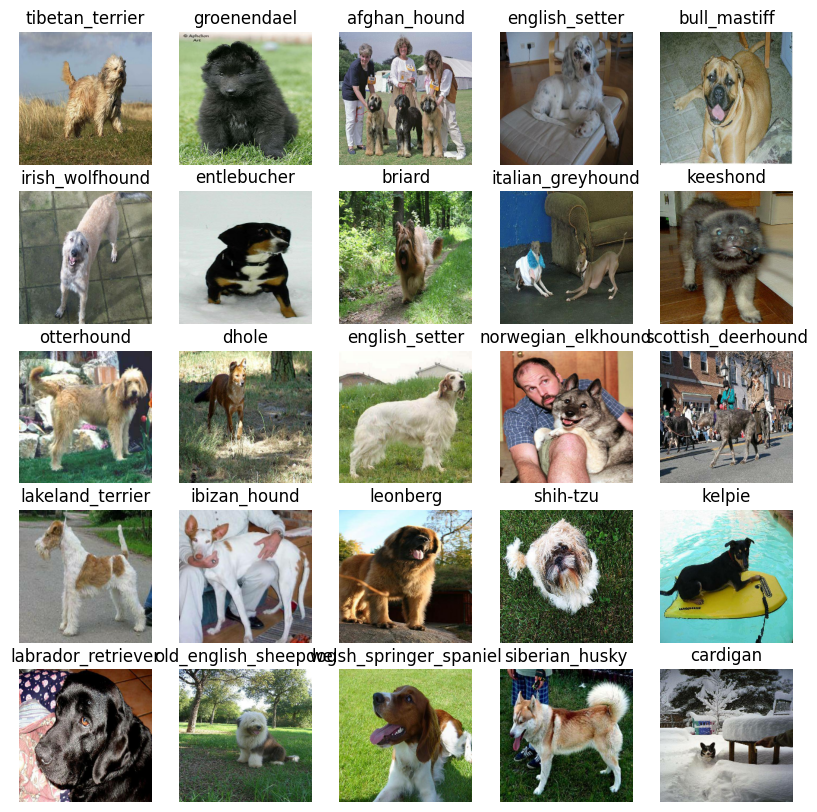

In [ ]:
#Now let's visualize the data in a training batch
show_25_images(train_images,train_labels)

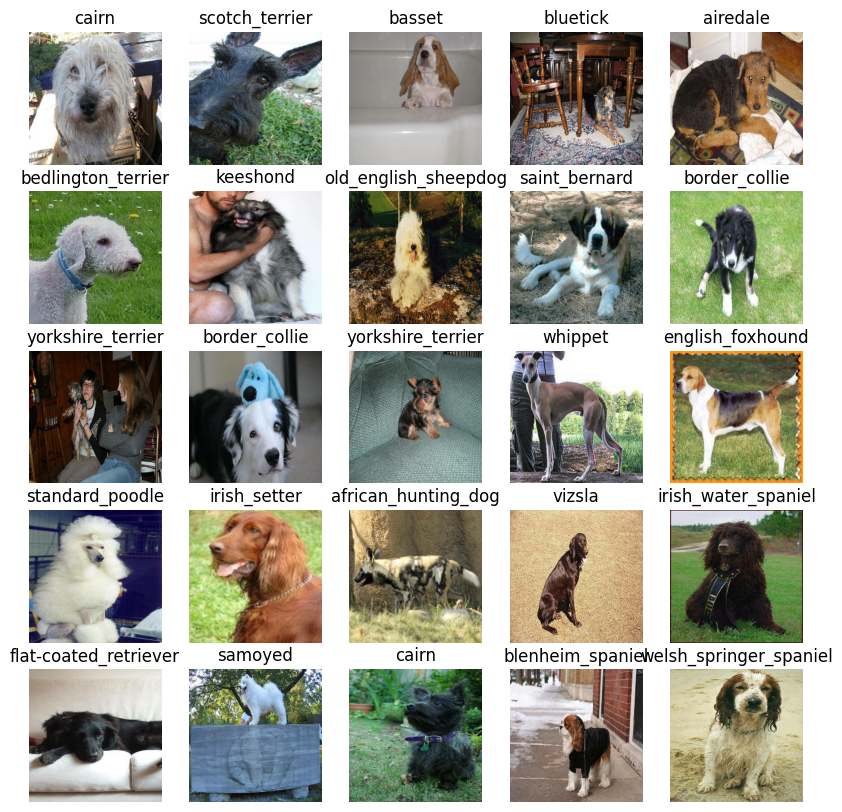

In [ ]:
#Now let's visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

##Building a model
Before we build a model, there a few things that we need to define:
* The input shape(our images shape,in the form of Tensors)
* The output shape(image labels in the form of tensors) of our model
* The URL of the model we want to use

In [ ]:
#Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channels
INPUT_SHAPE

[None, 224, 224, 3]

In [ ]:
#Setup output shape for the model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from Tensorflow hub
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"


Now we've got our inputs,outputs and model ready to go
Let's put them together into a Keras deep learning model!

Knowing this,let's create a function which
* Takes the input shape,output shape,model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first,then that and that)
* Compiles the model(says it should be evaluated and improved)
* Builds the model(tells the model the input shape it should be getting)
* Returns the model


In [ ]:
#Import keras
import tf_keras


#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",model_url)

  #Setup the model layers
  model=tf_keras.Sequential([
                             hub.KerasLayer(MODEL_URL),#Layer 1-input layer
                             tf_keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")])#Layer 2-output layer

  #Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), #Corrected spelling of CategoricalCrossentropy
      optimizer=tf_keras.optimizers.Adam(), # Use tf.keras.optimizers
      metrics=["accuracy"]
  )
  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


##Creating callbacks

Callbacks are helper functions that a model can use while training to do things such as save progress, check progress or stop training early in order to avoid overtraining.

We'll create two callbacks, one for tensorboard which helps track our models and another for early stopping.

##Tensorboard callback

To setup a tensorboard callback, we need to do three things.
1. Load the tensorboard notebook extension.
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function  


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing tensorboard logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

## Early stopping callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops.

In [ ]:
#Create early stopping callback

early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

# Training a model(on a subset of data)

Our first model is going to get trained on only 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
#Check to make sure we're still running on a GPU
print("GPU available" if tf.config.list_physical_devices("GPU") else print("GPU not avaliable"))

GPU available


### Let's create a function which trains our model

* Create a model using `create_model()`
* Setup a tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data,validation data and the number of epochs to train for(`NUM_EPOCHS`) and the callbakcs we'd like to use
* Return the model

In [ ]:
#Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model=create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we have created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  return model


In [ ]:
#Fit the model to the data
model=train_model()


Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 181s 7s/step - loss: 4.6816 - accuracy: 0.0825 - val_loss: 3.4570 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6614 - accuracy: 0.6938 - val_loss: 2.1338 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 5s 189ms/step - loss: 0.5594 - accuracy: 0.9413 - val_loss: 1.6616 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 5s 199ms/step - loss: 0.2467 - accuracy: 0.9850 - val_loss: 1.4828 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 164ms/step - loss: 0.1473 - accuracy: 0.9950 - val_loss: 1.3989 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1000 - accuracy: 0.9987 - val_loss: 1.3566 - val_accuracy: 0.6550
Epoch 7/100
25/25 [====================

### Checking the tensorboard logs

The tensorboard magic function (`%tensorboard`) will access the logs directly we have created earlier and visualize it's contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
# Make predictions on validation data
predictions=model.predict(val_data, verbose=1)
predictions



7/7 [==============================] - 2s 179ms/step


array([[1.41541800e-03, 6.56045740e-05, 4.58209636e-03, ...,
        4.48925130e-04, 3.25630572e-05, 8.54396145e-04],
       [6.80814590e-03, 2.00343784e-03, 4.43424517e-03, ...,
        8.48311000e-04, 3.46172927e-03, 4.57709975e-04],
       [2.02923518e-04, 6.87735301e-05, 1.16198980e-05, ...,
        5.60982153e-04, 3.61191313e-04, 3.66388878e-04],
       ...,
       [2.39350425e-06, 1.73485198e-04, 2.22636649e-04, ...,
        1.35966877e-06, 1.56920010e-04, 1.07192776e-04],
       [1.01750193e-03, 1.04458064e-04, 1.19366443e-04, ...,
        1.42210323e-04, 2.08930487e-05, 5.61479712e-03],
       [3.29846836e-04, 1.71099255e-05, 3.44682997e-03, ...,
        1.44986645e-03, 9.45621985e-04, 9.84657963e-05]], dtype=float32)

In [ ]:
predictions.shape


(200, 120)

In [ ]:
predictions[0]


array([1.41541800e-03, 6.56045740e-05, 4.58209636e-03, 9.36077558e-05,
       4.75518638e-04, 7.25481514e-05, 4.28702869e-03, 1.42796000e-03,
       2.75653641e-04, 6.82787853e-04, 2.25776152e-04, 6.57861819e-04,
       4.87069010e-05, 3.81503021e-04, 1.25495263e-03, 4.80031013e-04,
       2.42534952e-05, 1.21243149e-01, 1.68018596e-05, 1.00013094e-04,
       2.49771663e-04, 9.44833446e-04, 2.90918179e-05, 9.55532480e-04,
       1.21123929e-04, 1.59310235e-04, 2.82972395e-01, 9.75111616e-05,
       1.06302125e-03, 4.73231084e-05, 1.98839771e-04, 1.68132980e-03,
       3.45272478e-04, 9.11267271e-05, 1.92792322e-05, 3.05267200e-02,
       2.58491964e-05, 9.12418182e-04, 5.82871253e-05, 2.76564591e-04,
       2.88059283e-03, 7.50370527e-05, 2.28540914e-04, 2.57767359e-04,
       7.32142144e-05, 8.46127863e-04, 1.47268829e-05, 2.57854641e-04,
       3.13949306e-04, 1.17527270e-04, 9.17321959e-05, 1.19828313e-04,
       3.88727087e-04, 5.35855579e-05, 1.43918151e-04, 4.42618284e-06,
      

In [ ]:
np.sum(predictions[0])


1.0

In [ ]:
index=42
print(predictions[index])
print(f"Max value of predictions:{np.max(predictions[index])}")
print(f"Sum of predictions:{np.sum(predictions[index])}")
print(f"Max value index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[7.4345378e-05 3.9971725e-05 4.3695221e-05 3.3970537e-05 7.6217169e-04
 1.8379533e-05 3.2364533e-04 8.2649785e-04 5.5325539e-03 4.2427395e-02
 1.1368032e-05 6.6540233e-06 1.2728393e-04 3.9603254e-03 9.7797741e-04
 1.4869983e-03 1.1319090e-05 4.8751009e-04 1.8725314e-05 4.3819207e-03
 2.6645172e-05 6.5683818e-04 1.1035021e-04 1.1562794e-04 3.5807539e-02
 4.8638460e-05 5.1767474e-05 4.1042070e-04 1.3908141e-04 3.1038318e-05
 1.5026917e-04 6.0486531e-05 7.3832060e-05 1.9604675e-05 2.9471305e-05
 1.5503474e-05 1.2551079e-04 2.2522340e-04 6.7095796e-05 2.4807629e-01
 4.3647306e-04 1.6989974e-05 3.8331707e-03 1.0759249e-05 2.2393458e-04
 1.8133738e-04 1.3359496e-04 3.5903606e-04 1.5456490e-04 1.0202291e-04
 4.5251112e-05 2.4077682e-04 9.6329791e-04 1.0210662e-03 7.3742162e-06
 1.2461471e-04 3.0013996e-05 2.3572389e-05 2.6361455e-04 1.9418063e-05
 4.5238638e-05 5.8768305e-04 6.9315383e-06 2.4192594e-05 4.7724054e-05
 9.8917757e-05 1.2725692e-05 5.0036376e-04 3.6182180e-05 1.2579628e-05
 2.706

In [ ]:
unique_breeds[113]


'walker_hound'

###Having the above functionality is great but it would be better if we could see the image whose prediction is being made!
###**Note:** Prediction probabilites are also known as confidence levels.

In [ ]:
#Turn prediction probabilites into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a prediction label based on an array of prediction probabilites
pred_label=get_pred_label(predictions[81])
pred_label

'irish_terrier'

### Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
#Create a function to unbatch a batched dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
  """
  images_=[]
  labels_=[]
  for image,label in val_data.unbatch().as_numpy_iterator():

    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_


In [ ]:
#Unbatchify the validation data
images,labels=unbatchify(val_data)
labels

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

So now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make functions to visualize these better

Let's create a function which:
  * Takes an array of prediction probabilities, an array of truth labels and an array of integers.
  * Convert the array of prediction probabilities to a predicted label.
  * Plot the predicted label, it's prediction probability, the truth label and the target image on a single plot.

In [ ]:
labels[1]

'scotch_terrier'

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=predictions[n],labels[n],images[n]

  #Get the pred label
  pred_label=get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title(f"{pred_label} {round((np.max(pred_prob)*100),2)}{true_label}",color=color)


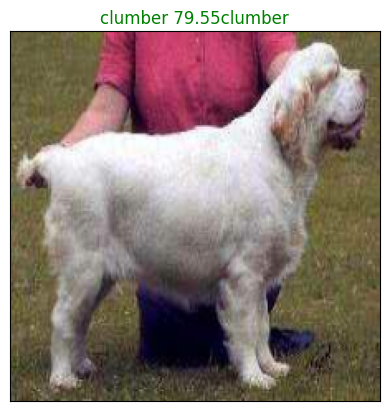

In [ ]:
plot_pred(predictions,labels,images,n=79)

Now we've got a function to visualize our model's top prediction, let's make another function to visualize our model's top 10 predictions

This function will
  * Take an input of prediction probabilities array, ground truth array,and an integer.
  * Find the prediction using `get_pred_label`
  * Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Predictions labels
 Plot the top 10 prediction probability values and labels, coloring the true labels green.   



In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the highest top 10 confidences, along with the truth label for sample n
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #Get the predicted label
  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_preds=pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction values
  top_10_vals=pred_prob[top_10_preds]

  #Find the top 10 prediction labels
  top_10_labels=unique_breeds[top_10_preds]

  #Setup plot
  top_plot=plt.bar(np.arange(len(top_10_labels)),top_10_vals,color="purple")

  true_label_name=unique_breeds[np.argmax(true_label)]


  if true_label_name in top_10_labels:
    # Get the index of the true label in top_10_labels using np.where
    true_label_index = np.where(top_10_labels == true_label_name)[0][0]

    # Change the color of the corresponding bar
    top_plot[true_label_index].set_color("green")

  plt.xticks(np.arange(len(top_10_labels)),
             labels=top_10_labels,
             rotation="vertical")



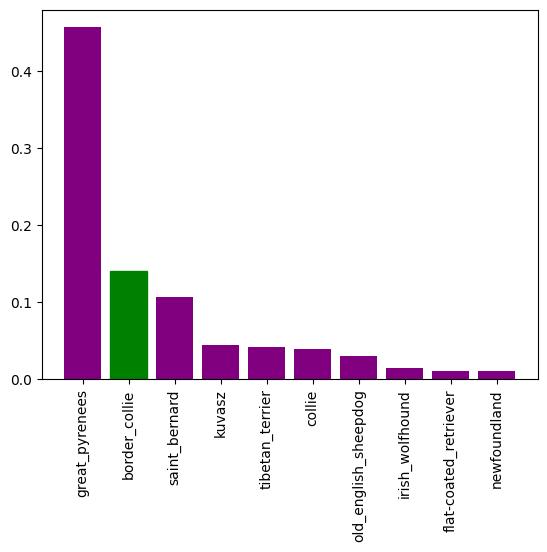

In [ ]:
plot_pred_conf(predictions,val_labels,n=11
               )

Now we've got some functions to help us visualize our predictions and evaluate our model.

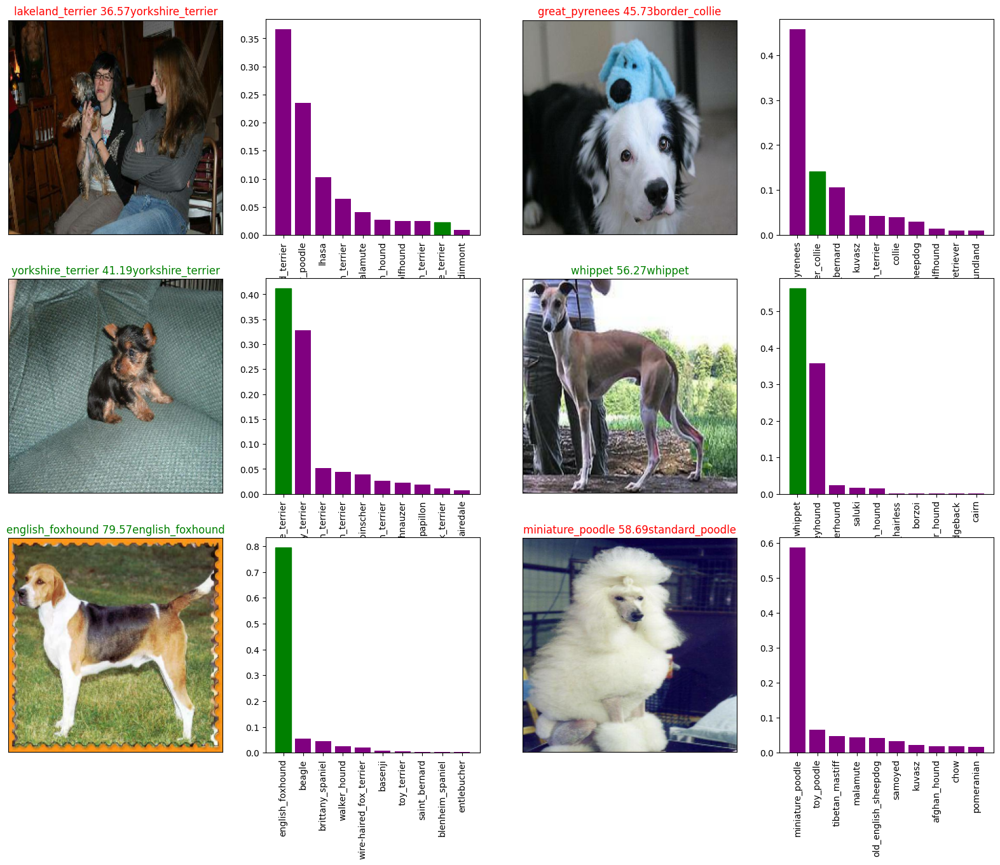

In [ ]:
#Let's check out a few predictions and their different values

i_multiplier=10
num_rows=3
num_cols=2
num_images =num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,
            labels,
            images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.show()

## Saving and reloading a trained model


In [ ]:
#Create a function to save a model:
def save_model(model,suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix
  """
  #Create a model directory with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"_"+suffix+".h5" #Save format of model
  print(f"Saving model to:{model_path}..")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load our trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from:{model_path}")
  model=tf_keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load our trained model,let's make sure they work

In [ ]:
#Save our model on 100 trained images
save_model(model,suffix="1000_images_mobilenetv2_adam")

Saving model to:drive/MyDrive/Dog Vision/models/20241104-06461730702788_1000_images_mobilenetv2_adam.h5..


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20241104-06461730702788_1000_images_mobilenetv2_adam.h5'

In [ ]:
#Load a trained model
loaded_1000_image_model=load_model('drive/MyDrive/Dog Vision/models/20241103-18251730658304_1000_images_mobilenetv2_adam.h5')

Loading saved model from:drive/MyDrive/Dog Vision/models/20241103-18251730658304_1000_images_mobilenetv2_adam.h5


In [ ]:
#Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.2384 - accuracy: 0.6900


[1.2384473085403442, 0.6899999976158142]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.2861 - accuracy: 0.6750


[1.2861011028289795, 0.675000011920929]

###Training the model on full data

In [ ]:
#Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model=create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
#Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 51s 143ms/step - loss: 1.3540 - accuracy: 0.6670
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.3994 - accuracy: 0.8843
Epoch 3/100
320/320 [==============================] - 40s 125ms/step - loss: 0.2347 - accuracy: 0.9381
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1536 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 53s 166ms/step - loss: 0.1060 - accuracy: 0.9799
Epoch 6/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0779 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0592 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0455 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0370 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 43s 135m

In [ ]:
save_model(full_model,suffix="full_data_mobilenetv2_adam")

Saving model to:drive/MyDrive/Dog Vision/models/20241104-07101730704241_full_data_mobilenetv2_adam.h5..


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20241104-07101730704241_full_data_mobilenetv2_adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Dog Vision/models/20241104-07101730704241_full_data_mobilenetv2_adam.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20241104-07101730704241_full_data_mobilenetv2_adam.h5


In [ ]:
len(X)

10222

##Making predictions on the test data set

Since our model has beeen trained by images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we've created `create_data_batches` earlier which can take a list of filenames as input and convert them into tensorbatches.

To make predictions on the test data, we'll
  * Get the test image filenames
  * Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to true.
  * Make a predictions array by passing the test data batches to the `predict()` method called on our model.


In [ ]:
#Load test image filenames
test_path="drive/MyDrive/Dog Vision/test"
test_filenames=[test_path+"/"+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/a354ad4e3e240da15462005e40b4583c.jpg',
 'drive/MyDrive/Dog Vision/test/a2bbd23246f2366b6aa0ec0d23dc7e70.jpg',
 'drive/MyDrive/Dog Vision/test/9c4aaa9c34c291a0fbcc5eb5136a3481.jpg',
 'drive/MyDrive/Dog Vision/test/a5c82c75543587b168d36bd178a1b456.jpg',
 'drive/MyDrive/Dog Vision/test/9bc5701373a8e4cb3d64d75322a19f9b.jpg',
 'drive/MyDrive/Dog Vision/test/a44bf9ce05d46a65d22049d186f8f813.jpg',
 'drive/MyDrive/Dog Vision/test/a057d4b2a4343cb814937b517fb3be9a.jpg',
 'drive/MyDrive/Dog Vision/test/9c9e4d933c582b01c2a7512fbefa03cc.jpg',
 'drive/MyDrive/Dog Vision/test/9fc3dd94b5db3201db33501904df6dbf.jpg',
 'drive/MyDrive/Dog Vision/test/a07211e87a6f435fec0c126dee3f9530.jpg']

In [ ]:
#Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating  test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

230/230 [==============================] - 299s 1s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions=np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions.shape

(7334, 120)

##Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission,we find that it wants our model's prediction probability outputs in a datafram with ID and a column for each dog breed.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

What we'll do
  * Create a pandas dataframe with an ID column and columns for each dog breed.
  * Add data to the ID column by extracting the IDs from the image filepaths.
  * Add data(prediction probabilities) to each of the dog breed columns.
  * Export the DataFrame as a CSV to submit it to Kaggle.
   

In [ ]:
#Create a pandas dataframe
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))

In [ ]:
#Extract ids from the filenames
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]


['a354ad4e3e240da15462005e40b4583c',
 'a2bbd23246f2366b6aa0ec0d23dc7e70',
 '9c4aaa9c34c291a0fbcc5eb5136a3481',
 'a5c82c75543587b168d36bd178a1b456',
 '9bc5701373a8e4cb3d64d75322a19f9b',
 'a44bf9ce05d46a65d22049d186f8f813',
 'a057d4b2a4343cb814937b517fb3be9a',
 '9c9e4d933c582b01c2a7512fbefa03cc',
 '9fc3dd94b5db3201db33501904df6dbf',
 'a07211e87a6f435fec0c126dee3f9530']

In [ ]:
preds_df["id"]=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,a354ad4e3e240da15462005e40b4583c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,a2bbd23246f2366b6aa0ec0d23dc7e70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9c4aaa9c34c291a0fbcc5eb5136a3481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,a5c82c75543587b168d36bd178a1b456,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,9bc5701373a8e4cb3d64d75322a19f9b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Add the prediction probabilities

preds_df[list(unique_breeds)]=test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,a354ad4e3e240da15462005e40b4583c,4.459317e-12,3.652170e-07,1.328149e-07,5.246386e-07,2.911682e-10,4.576153e-09,2.583529e-08,2.519912e-11,1.226068e-12,...,9.271232e-11,2.640957e-10,2.015133e-10,3.264425e-07,3.403330e-09,7.431582e-10,7.096092e-11,7.531268e-10,3.418502e-07,1.153960e-10
1,a2bbd23246f2366b6aa0ec0d23dc7e70,3.881519e-11,1.366982e-07,5.760828e-09,7.362142e-09,1.944118e-06,1.633802e-08,6.067713e-04,3.494700e-01,8.491501e-04,...,2.916657e-09,2.377111e-03,4.033768e-07,1.798587e-09,4.121180e-07,2.623867e-09,6.152931e-09,3.012929e-05,2.685197e-06,5.047702e-08
2,9c4aaa9c34c291a0fbcc5eb5136a3481,2.158524e-09,1.442746e-10,5.941369e-11,8.062257e-07,1.085947e-10,2.424401e-12,2.658769e-13,1.343667e-13,3.098612e-14,...,2.265692e-10,6.520129e-11,4.330878e-10,3.361176e-11,4.343447e-12,1.277377e-12,4.561393e-12,7.484696e-11,6.831284e-13,1.237496e-08
3,a5c82c75543587b168d36bd178a1b456,4.520095e-09,4.180573e-12,5.443455e-12,1.419457e-13,5.357902e-10,4.945373e-14,1.376823e-08,3.171280e-11,4.182402e-11,...,2.717187e-07,1.269534e-10,6.211702e-12,1.612853e-11,5.991894e-11,5.359632e-13,2.883107e-08,1.699270e-12,7.218470e-11,2.725689e-09
4,9bc5701373a8e4cb3d64d75322a19f9b,7.824774e-10,2.936156e-09,2.225888e-09,8.088830e-11,1.374661e-10,5.149462e-12,1.993289e-12,2.000410e-09,7.041121e-09,...,4.998649e-09,1.147448e-11,2.638374e-11,2.436256e-11,3.229488e-09,3.511815e-12,2.720393e-10,5.034082e-08,7.151891e-10,2.307804e-09


In [ ]:
#Save our predictions dataframe to a CSV file for submission
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission1_mobilenetV2.csv",
                index=False)

##Making predictions on custom images

To make predictions on custom images,we'll have to
  * Get the filepaths of those images.
  * Turn the filepaths into data batches using `create_data_batches`. Mention test_dat=True as there are no labels.
  * Pass the data batches to the `predict()` function.
  * Convert the prediction output probabilities to prediction labels.
  * Compare the predicted labels to the custom images

In [ ]:
custom_path="drive/MyDrive/Dog Vision/custom_pics"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

NameError: name 'test_predictions' is not defined

In [ ]:
custom_image_paths

In [ ]:
#Turn custom image paths into data batches
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

In [ ]:
#Make predictions on the custom data
custom_preds=load_full_model.predict(custom_data)

In [ ]:
custom_preds

In [ ]:
#Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
#Get custom images
custom_images=[]
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)